# Project 8 Homework - Working with OLS

In [1]:
import pandas as pd
import pandas_datareader as web
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
data = pd.read_csv("fraserDataWithRGDPPC.csv", index_col = [0,1], parse_dates = True)
years = np.array(sorted(list(set(data.index.get_level_values("Year")))))
years = pd.date_range(years[0],
                      years[-2], 
                      freq = "AS")
countries  = sorted(list(set(data.index.get_level_values("ISO_Code"))))
index_names = list(data.index.names)
multi_index = pd.MultiIndex.from_product([countries, years[:-1]],
                                         names = data.index.names)
data = data.reindex(multi_index)
data

EFW  Size of Government  \
ISO_Code Year                                       
AGO      1970-01-01       NaN                 NaN   
         1971-01-01       NaN                 NaN   
         1972-01-01       NaN                 NaN   
         1973-01-01       NaN                 NaN   
         1974-01-01       NaN                 NaN   
...                       ...                 ...   
ZWE      2011-01-01  4.843441            6.424630   
         2012-01-01  4.971192            6.670469   
         2013-01-01  5.246723            6.325105   
         2014-01-01  5.582478            6.433165   
         2015-01-01  6.145330            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      1970-01-01                             NaN          NaN   
         1971-01-01                             NaN          NaN   
         1972-01-01                             NaN          NaN   
         1973-01-01                             NaN          NaN   
         1974-01-01                             NaN          NaN   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      1970-01-01                               NaN         NaN   
         1971-01-01                               NaN         NaN   
         1972-01-01                               NaN         NaN   
         1973-01-01                               NaN         NaN   
         1974-01-01                               NaN         NaN   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita  
ISO_Code Year                         
AGO      1970-01-01              NaN  
         1971-01-01              NaN  
         1972-01-01              NaN  
         1973-01-01              NaN  
         1974-01-01              NaN  
...                              ...  
ZWE      2011-01-01           1515.0  
         2012-01-01           1604.0  
         2013-01-01           1604.0  
         2014-01-01           1594.0  
         2015-01-01           1560.0  

[7452 rows x 7 columns]

## 1. Use the np.log() function to log the values of RGDP per capita. Create a lag for this new variable and rerun the regression using these new logged values as well as untransformed Economic Freedom Index Values (don't log these variables!). (hint: you may reimport the csv file).

In [2]:
data["Log RGDP Per Capita"] = np.log(data["RGDP Per Capita"])
data["Log RGDP Per Capita Lag"] = data.groupby("ISO_Code")["Log RGDP Per Capita"].shift()
data

EFW  Size of Government  \
ISO_Code Year                                       
AGO      1970-01-01       NaN                 NaN   
         1971-01-01       NaN                 NaN   
         1972-01-01       NaN                 NaN   
         1973-01-01       NaN                 NaN   
         1974-01-01       NaN                 NaN   
...                       ...                 ...   
ZWE      2011-01-01  4.843441            6.424630   
         2012-01-01  4.971192            6.670469   
         2013-01-01  5.246723            6.325105   
         2014-01-01  5.582478            6.433165   
         2015-01-01  6.145330            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      1970-01-01                             NaN          NaN   
         1971-01-01                             NaN          NaN   
         1972-01-01                             NaN          NaN   
         1973-01-01                             NaN          NaN   
         1974-01-01                             NaN          NaN   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      1970-01-01                               NaN         NaN   
         1971-01-01                               NaN         NaN   
         1972-01-01                               NaN         NaN   
         1973-01-01                               NaN         NaN   
         1974-01-01                               NaN         NaN   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     RGDP Per Capita  Log RGDP Per Capita  \
ISO_Code Year                                               
AGO      1970-01-01              NaN                  NaN   
         1971-01-01              NaN                  NaN   
         1972-01-01              NaN                  NaN   
         1973-01-01              NaN                  NaN   
         1974-01-01              NaN                  NaN   
...                              ...                  ...   
ZWE      2011-01-01           1515.0             7.323171   
         2012-01-01           1604.0             7.380256   
         2013-01-01           1604.0             7.380256   
         2014-01-01           1594.0             7.374002   
         2015-01-01           1560.0             7.352441   

                     Log RGDP Per Capita Lag  
ISO_Code Year                                 
AGO      1970-01-01                      NaN  
         1971-01-01                      NaN  
         1972-01-01                      NaN  
         1973-01-01                      NaN  
         1974-01-01                      NaN  
...                                      ...  
ZWE      2011-01-01                 7.247081  
         2012-01-01                 7.323171  
         2013-01-01                 7.380256  
         2014-01-01                 7.380256  
         2015-01-01                 7.374002  

[7452 rows x 9 columns]

In [3]:
y_var = ["Log RGDP Per Capita"]
x_vars = ["Size of Government",
          "Legal System & Property Rights", 
          "Sound Money", 
          "Freedom to trade internationally", 
          "Regulation"]
reg_vars = y_var + x_vars
reg_data = data[reg_vars].dropna()
reg_data.corr().round(4)

,Log RGDP Per Capita,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation
Log RGDP Per Capita,1.0000,-0.1572,0.7280,0.4876,0.5736,0.4968
Size of Government,-0.1572,1.0000,-0.1015,0.1981,0.2415,0.2077
Legal System & Property Rights,0.7280,-0.1015,1.0000,0.5231,0.6290,0.5940
Sound Money,0.4876,0.1981,0.5231,1.0000,0.6790,0.5980
Freedom to trade internationally,0.5736,0.2415,0.6290,0.6790,1.0000,0.6465
Regulation,0.4968,0.2077,0.5940,0.5980,0.6465,1.0000


In [4]:
reg_data.describe().round(4)

,Log RGDP Per Capita,Size of Government,Legal System & Property Rights,Sound Money,Freedom to trade internationally,Regulation
count,2579.0000,2579.0000,2579.0000,2579.0000,2579.0000,2579.0000
mean,9.1458,6.3466,5.2261,7.7571,6.9021,6.6553
std,1.2063,1.2353,1.7417,1.8516,1.5222,1.1695
min,6.2596,1.5731,0.9910,0.0000,0.0000,2.1015
25%,8.2924,5.5207,3.9558,6.7408,6.1809,5.9283
50%,9.3029,6.4162,5.1714,8.1146,7.1491,6.7514
75%,10.0987,7.1838,6.3514,9.3191,7.9754,7.4754
max,11.9578,9.5142,9.1381,9.8867,10.0000,9.4430


In [5]:
y = reg_data[y_var]
x = reg_data[x_vars]
#x["Constant"] = 1
results = sm.OLS(y,x).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                 
========================================================================================
Dep. Variable:     Log RGDP Per Capita   R-squared (uncentered):                   0.983
Model:                             OLS   Adj. R-squared (uncentered):              0.983
Method:                  Least Squares   F-statistic:                          2.957e+04
Date:                 Tue, 02 Nov 2021   Prob (F-statistic):                        0.00
Time:                         11:12:58   Log-Likelihood:                         -4144.1
No. Observations:                 2579   AIC:                                      8298.
Df Residuals:                     2574   BIC:                                      8328.
Df Model:                            5                                                  
Covariance Type:             nonrobust                                                  
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Size of Government                   0.2655      0.018     14.588      0.000       0.230       0.301
Legal System & Property Rights       0.3998      0.020     19.919      0.000       0.360       0.439
Sound Money                          0.0930      0.018      5.070      0.000       0.057       0.129
Freedom to trade internationally     0.1799      0.025      7.080      0.000       0.130       0.230
Regulation                           0.4926      0.027     18.157      0.000       0.439       0.546
==============================================================================
Omnibus:                      308.281   Durbin-Watson:                   0.323
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              527.492
Skew:                           0.805   Prob(JB):                    2.86e-115
Kurtosis:                       4.522   Cond. No.                         19.7
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## 2. Plot the residuals in a bar chart. Explain why the shape of the distribution of these residuals are distinct from the shape of the residuals plotted in the first regression from this lesson.

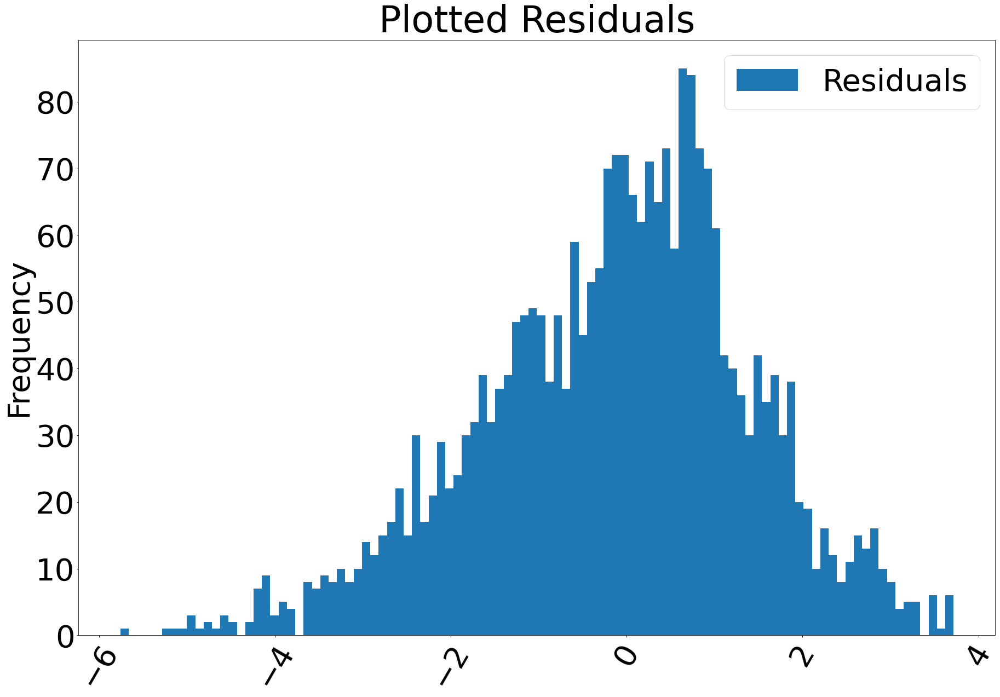

In [6]:
predictor = results.predict()
reg_data[y_var[0]+" Predictor"] = predictor

y_name = y_var[0]
y_hat = reg_data[y_name + " Predictor"]
y_mean = reg_data[y_name].mean()
y = reg_data[y_name]
reg_data["Residuals"] = (y_hat.sub(y_mean))
reg_data["Squared Residuals"] = reg_data["Residuals"].pow(2)
reg_data["Squared Errors"] = (y.sub(y_hat)).pow(2)
reg_data["Squared Totals"] = (y.sub(y_mean)).pow(2)

plt.rcParams.update({"font.size":56})
fig, ax = plt.subplots(figsize = (30,20))
reg_data[["Residuals"]].plot.hist(bins = 100, ax = ax)
plt.title("Plotted Residuals")
plt.xticks(rotation=60);

This plot of residuals is more accurate than the first outcome as the tails aren't quite as fat but there are still fat tails and alot of outliers. 

In [7]:
reg_data

Log RGDP Per Capita  Size of Government  \
ISO_Code Year                                                  
AGO      2005-01-01             8.544030            4.652865   
         2006-01-01             8.703507            5.342913   
         2007-01-01             8.878079            5.239228   
         2008-01-01             8.979165            5.307379   
         2009-01-01             8.974618            7.104953   
...                                  ...                 ...   
ZWE      2011-01-01             7.323171            6.424630   
         2012-01-01             7.380256            6.670469   
         2013-01-01             7.380256            6.325105   
         2014-01-01             7.374002            6.433165   
         2015-01-01             7.352441            6.402772   

                     Legal System & Property Rights  Sound Money  \
ISO_Code Year                                                      
AGO      2005-01-01                        3.148805     1.262168   
         2006-01-01                        3.546463     4.061198   
         2007-01-01                        3.569182     4.453327   
         2008-01-01                        3.654098     5.032836   
         2009-01-01                        3.622792     5.238259   
...                                             ...          ...   
ZWE      2011-01-01                        3.943725     4.109198   
         2012-01-01                        4.013004     5.378742   
         2013-01-01                        3.575827     6.895530   
         2014-01-01                        3.615584     7.966798   
         2015-01-01                        3.820360     8.180178   

                     Freedom to trade internationally  Regulation  \
ISO_Code Year                                                       
AGO      2005-01-01                          6.218266    4.729310   
         2006-01-01                          6.158949    5.306135   
         2007-01-01                          6.115462    5.524626   
         2008-01-01                          5.687976    5.221726   
         2009-01-01                          5.811844    5.011598   
...                                               ...         ...   
ZWE      2011-01-01                          5.366773    4.372878   
         2012-01-01                          5.132305    3.661438   
         2013-01-01                          5.589087    3.848068   
         2014-01-01                          5.909121    3.987721   
         2015-01-01                          5.679719    6.643620   

                     Log RGDP Per Capita Predictor  Residuals  \
ISO_Code Year                                                   
AGO      2005-01-01                       6.060087  -3.085707   
         2006-01-01                       6.936055  -2.209739   
         2007-01-01                       7.053876  -2.091918   
         2008-01-01                       6.933694  -2.212100   
         2009-01-01                       7.336353  -1.809441   
...                                            ...        ...   
ZWE      2011-01-01                       6.784319  -2.361475   
         2012-01-01                       6.602723  -2.543071   
         2013-01-01                       6.651414  -2.494380   
         2014-01-01                       6.921997  -2.223797   
         2015-01-01                       8.282626  -0.863168   

                     Squared Residuals  Squared Errors  Squared Totals  
ISO_Code Year                                                           
AGO      2005-01-01           9.521588        6.169972        0.362120  
         2006-01-01           4.882946        3.123885        0.195618  
         2007-01-01           4.376123        3.327719        0.071671  
         2008-01-01           4.893388        4.183951        0.027765  
         2009-01-01           3.274077        2.683912        0.029301  
...                                ...          

## 3. Plot a scatter plot with RGDP Per Capita on the horizontal axis and the predictor on the vertical axis. Then plot a scatter plot with RGDP Per Capita on the horizontal axis and the residual on the vertical axis. Are the residuals normally distributed? Why or why not? Why does this matter?

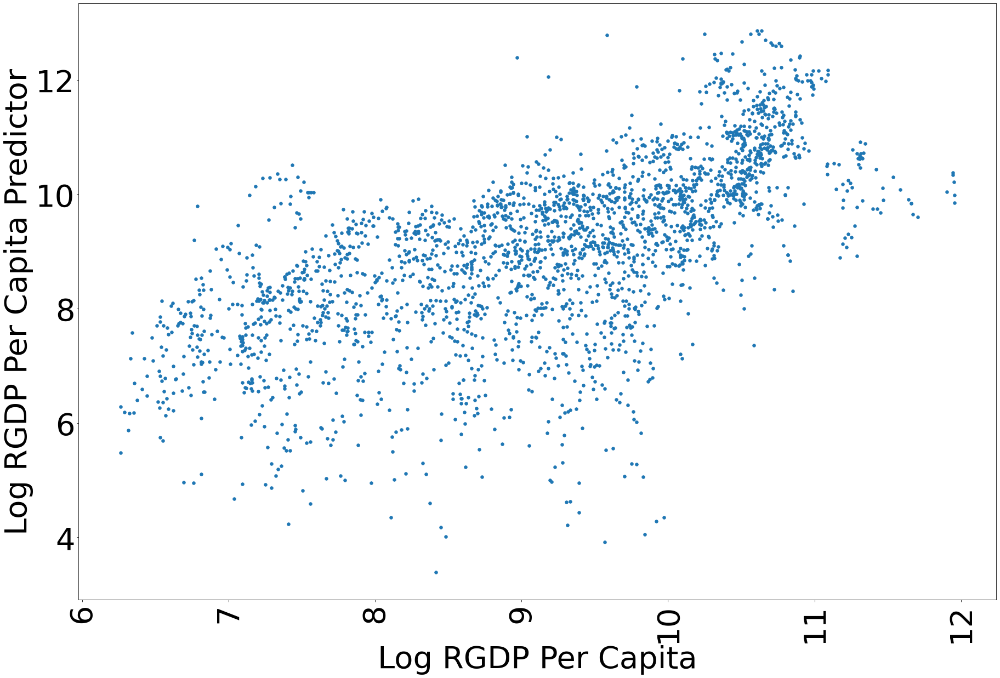

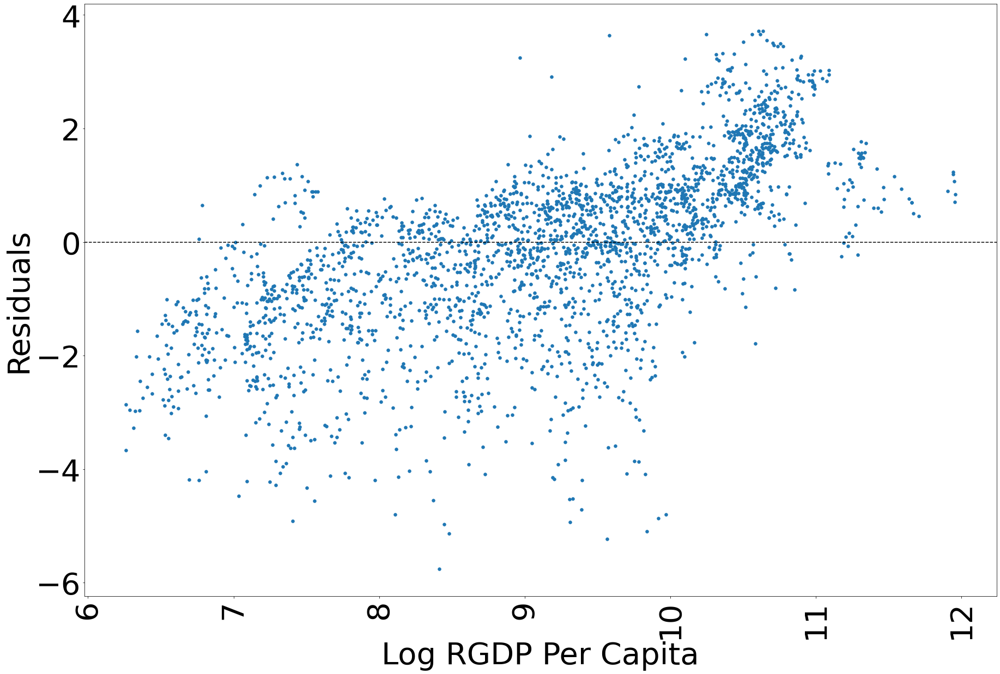

In [8]:
fig, ax = plt.subplots(figsize = (30,20))
reg_data.plot.scatter(x = y_var[0],
                 y = "Log RGDP Per Capita Predictor", 
                  s = 30, ax = ax)
plt.xticks(rotation=90)
plt.show()
plt.close()

fig, ax = plt.subplots(figsize = (30,20))
reg_data.plot.scatter(x = y_var[0],
                 y = "Residuals", 
                  s = 30, ax = ax)
ax.axhline(0, ls = "--", color = "k")
plt.xticks(rotation=90)
plt.show()
plt.close()

The residuals are not normally distributed and this is a problem because that impacts the accuracy of the predicted outcome as the error term will vary.

## 4. Plot the observed and predicted logged values of RGDP Per Capita for each individual country.

<ipython-input-9-47761a41df7e>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data[key] = plot_data[key] + 1


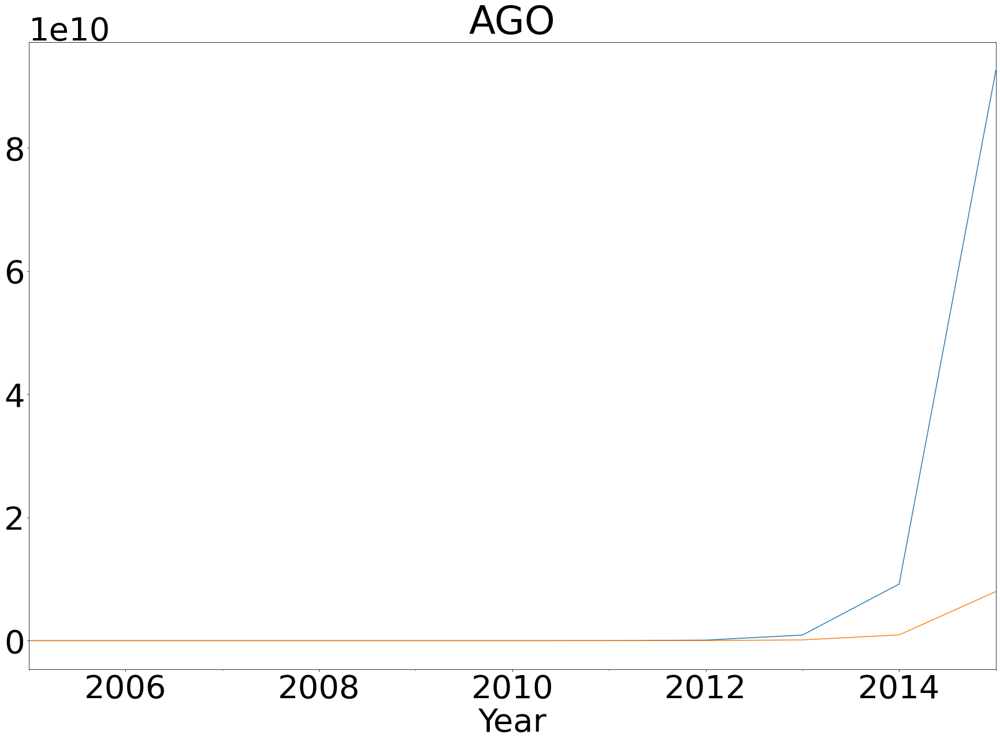

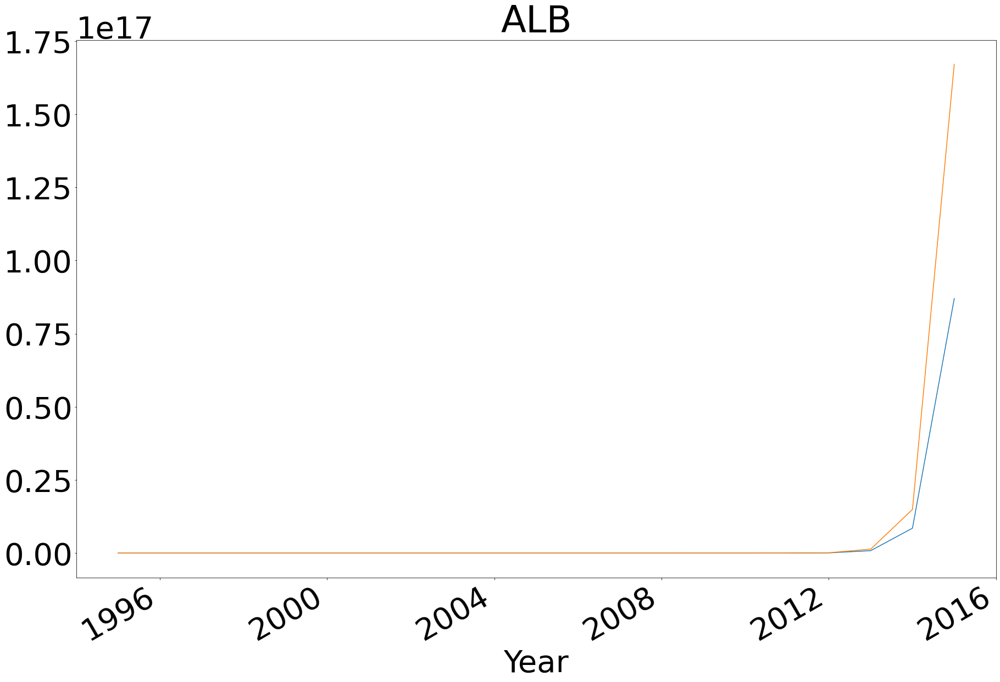

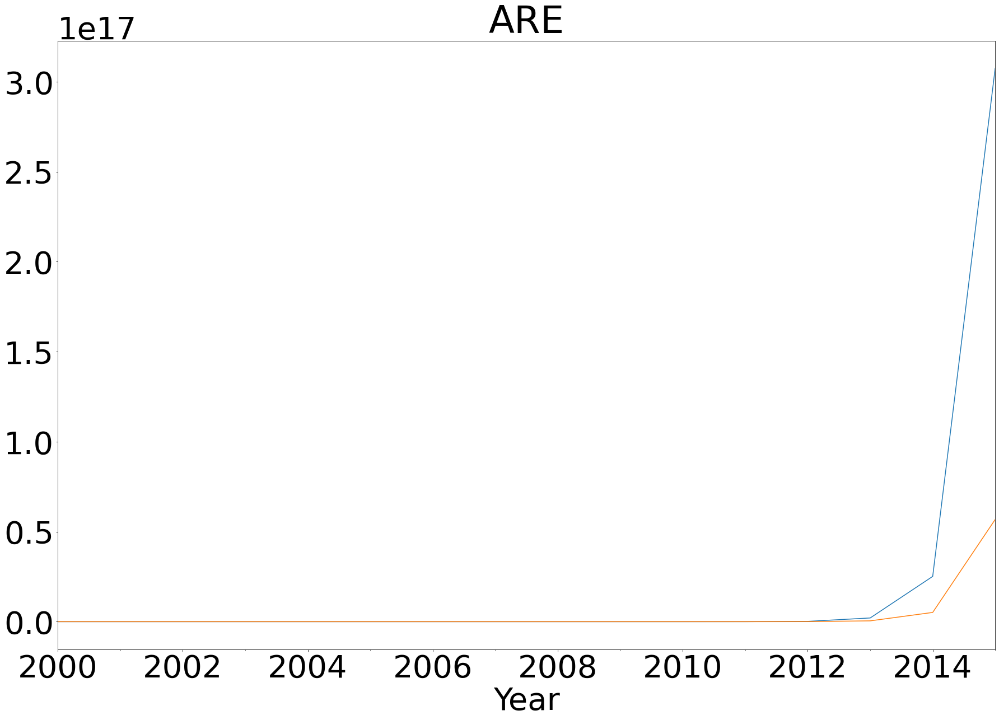

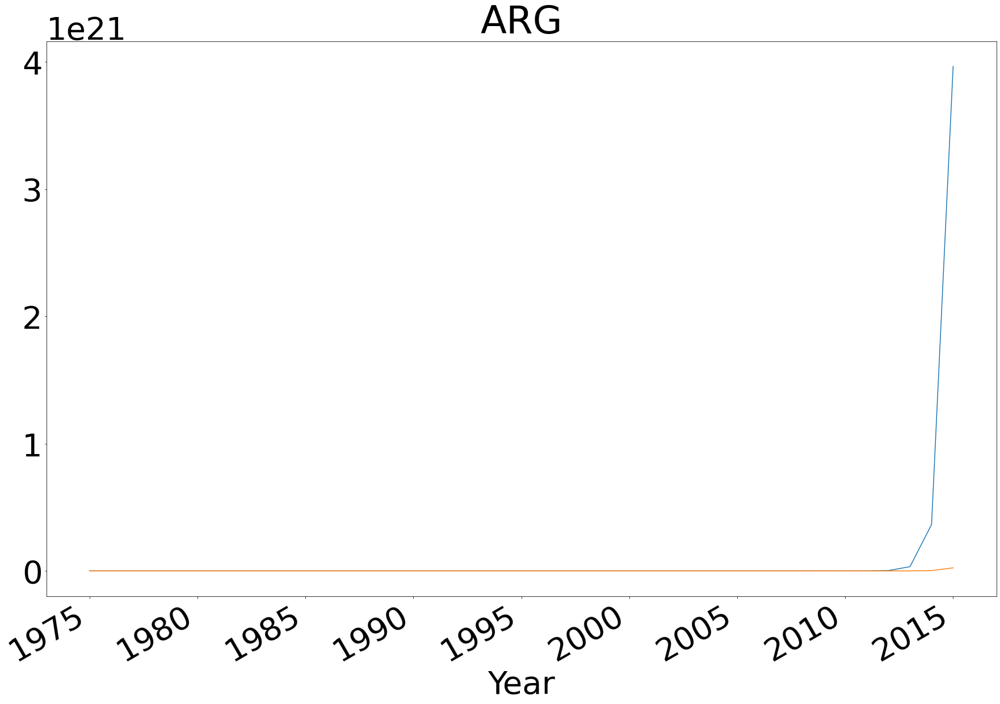

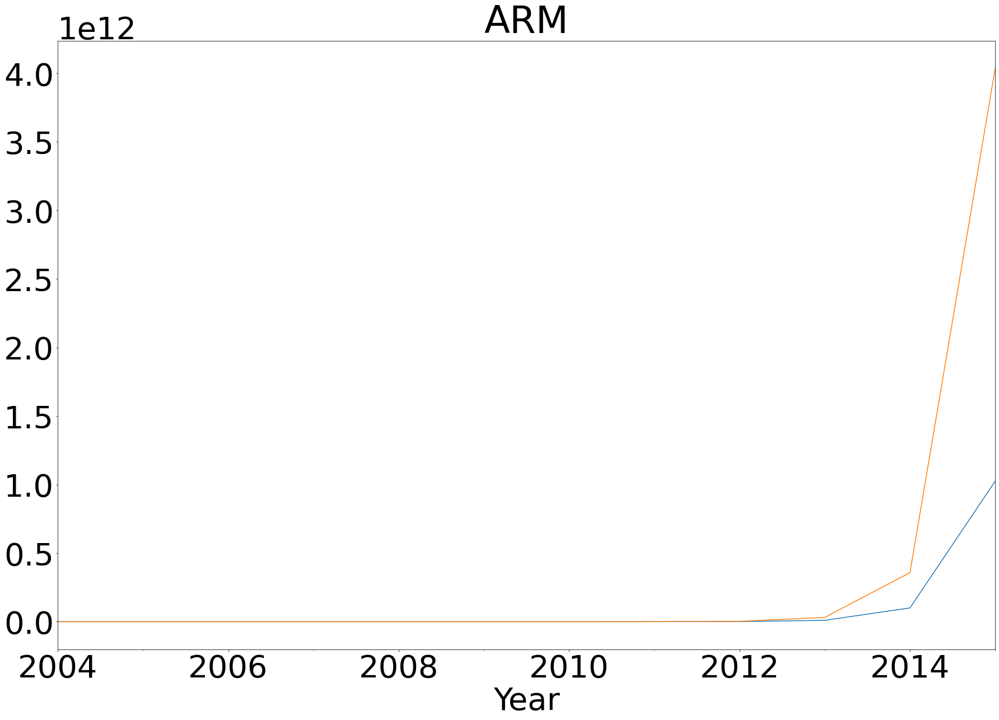

...

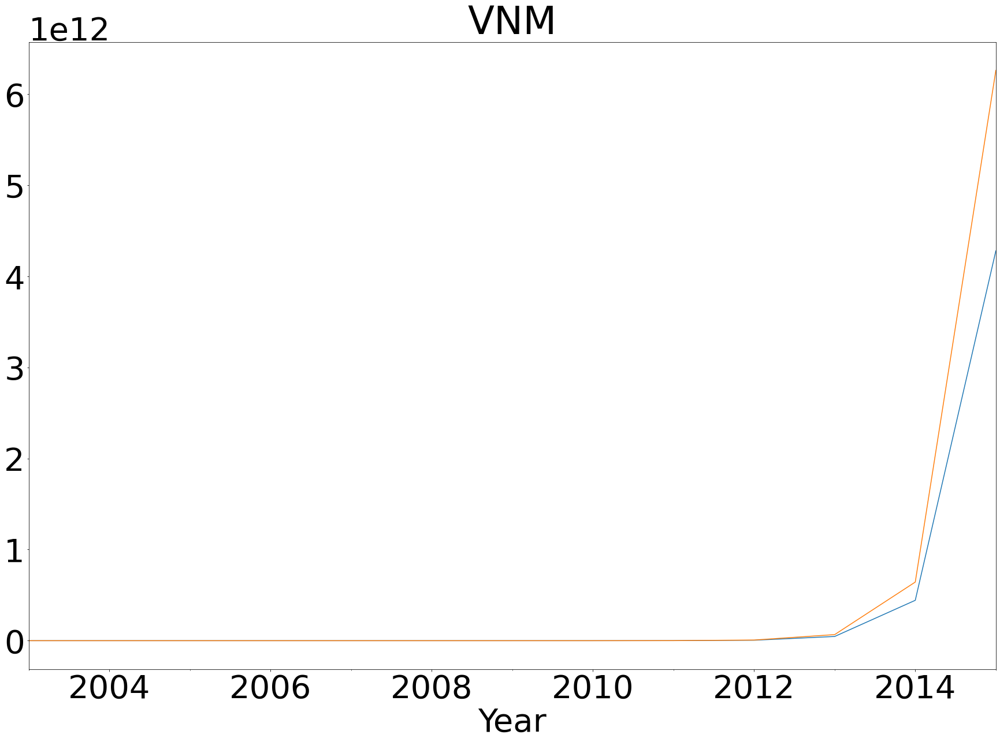

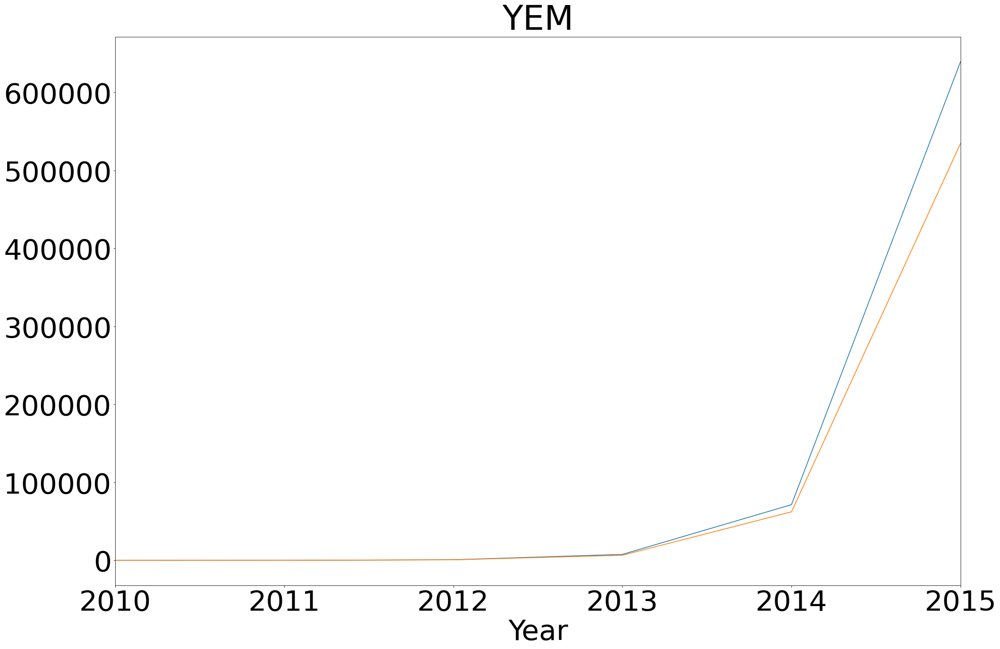

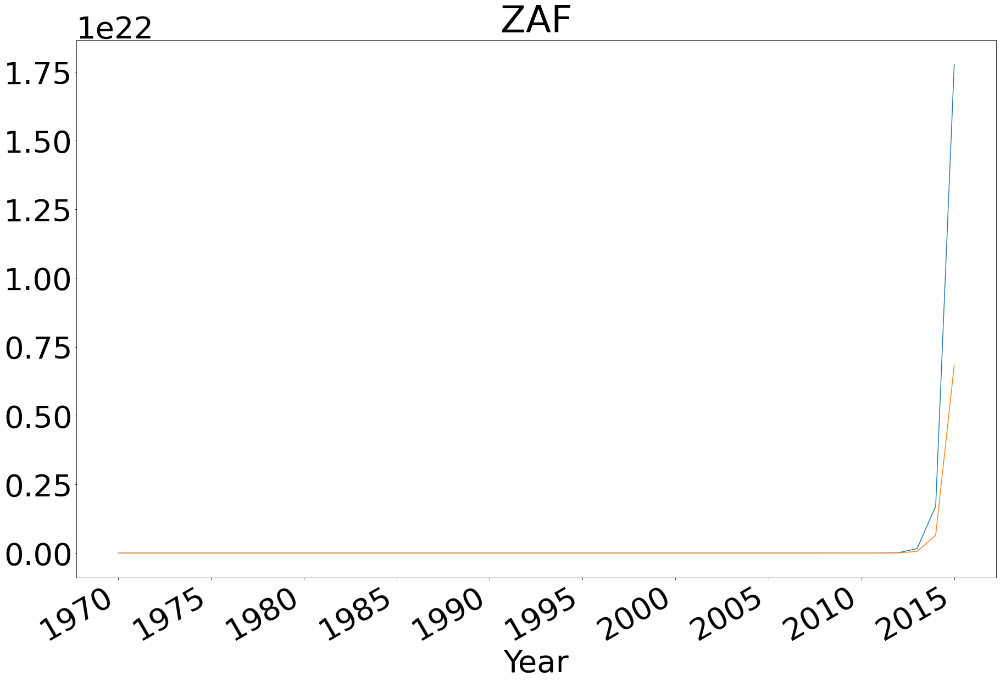

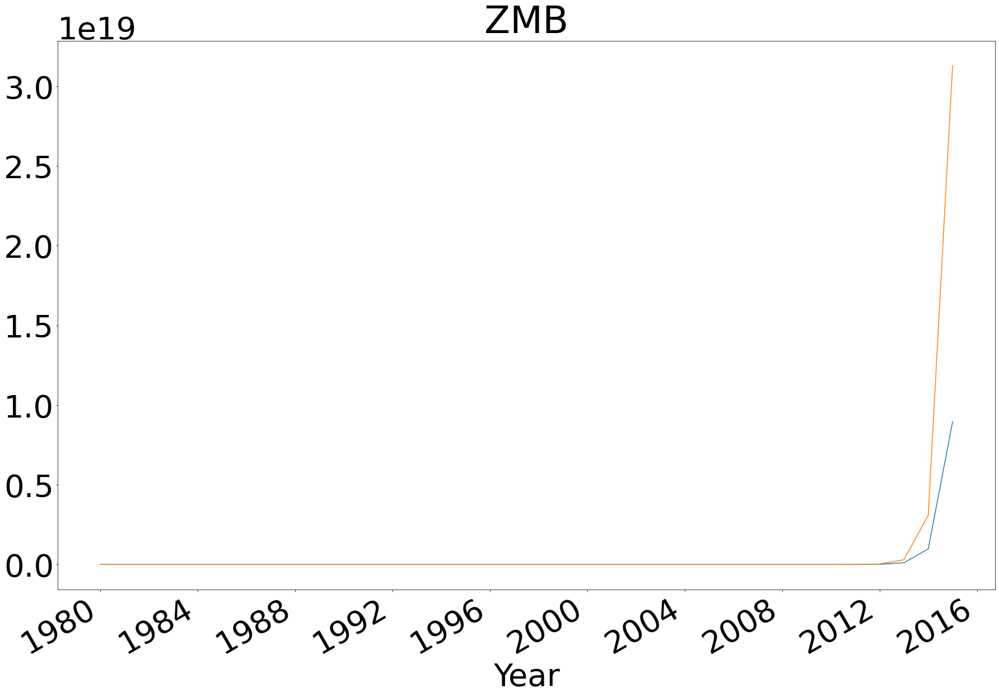

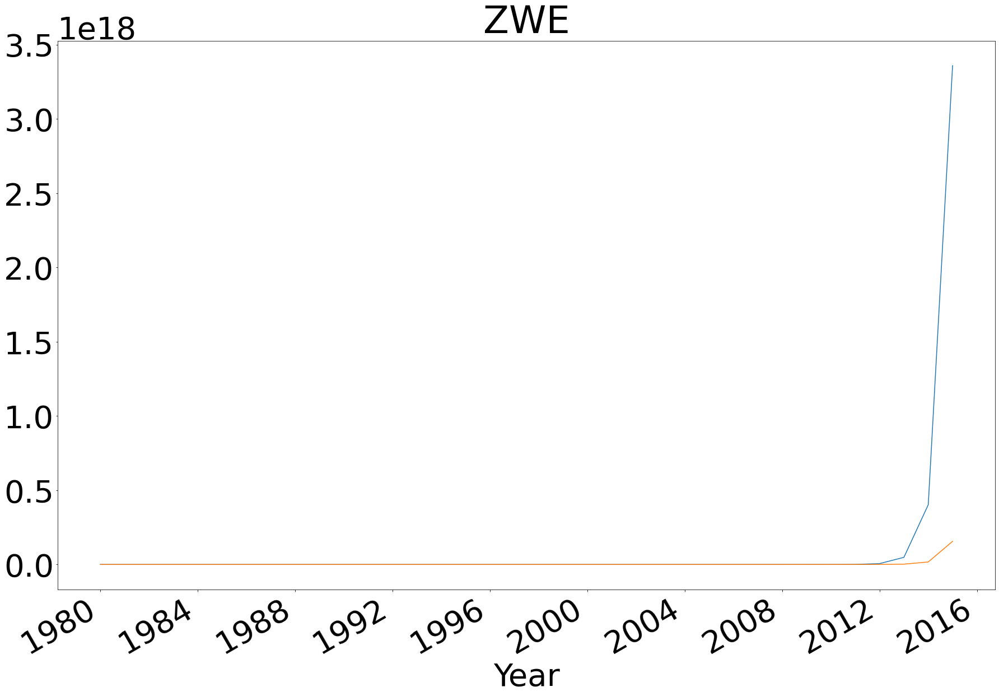

In [9]:
countries = reg_data.groupby("ISO_Code").mean().index
plot_data = reg_data[y_var + ["Log RGDP Per Capita Predictor"]]
for key in plot_data:
    plot_data[key] = plot_data[key] + 1 
for country in countries:
    fig, ax = plt.subplots(figsize = (30,20))

    plot_data[y_var + ["Log RGDP Per Capita Predictor"]].loc[country].cumprod().plot.line(ax = ax, legend = False)
    
    ax.set_title(country)
    
    plt.show()
    plt.close();